In [2]:
import numpy as np
import pandas as pd
import re
import scipy.stats as st
import sklearn.metrics as met
import matplotlib.pyplot as plt
import sklearn.preprocessing as prep
from sklearn.model_selection import StratifiedKFold

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
import hyperopt.pyll.stochastic

import time
import copy

%matplotlib inline
title = 'PPD'
path = '../sources/data/PPD-First-Round-Data'
icy = 'target'

# def Del_string(xstr):
#     xstrc = xstr.strip().strip(u'市').strip(u'省')
#     if(xstrc == ''):
#         xstrc = np.nan
#     return(xstrc)

## Reload DataSet for Model

In [3]:
pathofDataSaving = '../sources/deal/PPD-Data-Saving'
irt = np.load('{}/{}_irt.npy'.format(pathofDataSaving, title))
irv = np.load('{}/{}_irv.npy'.format(pathofDataSaving, title))
dac = pd.read_hdf('{}/{}_dac.h5'.format(pathofDataSaving, title), key = 'dac')
print dac.shape
print dac.loc[irt, icy].value_counts()/dac.loc[irt, icy].shape[0]
# dac.loc[:, [icy]]
# dac.loc[:, icy]

(49999, 389)
0.0    0.926733
1.0    0.073267
Name: target, dtype: float64


## DataSet Division, Missing Deal & Standardization

xt -  
yt -  
xv -  

In [4]:
y = dac.loc[:, [icy]]
icx = list(set(dac.columns) - set([icy]))
x = dac.loc[:, icx]
x = x.apply(lambda x: x.fillna(x.median()),axis=0) # 使用中位数填充缺失值
x = (x.rank(pct = True)-0.5/x.shape[0]).apply(st.norm.ppf) # 正态标准化
#x = (x - x.mean())/x.std() # 中心归一标准化
xt = x.loc[irt, :].values
yt = y.loc[irt, :].values
xv = x.loc[irv, :].values

In [6]:
# np.var(x, axis=0)


Education_Info4_AR                0.022988
ThirdParty_Info_16_max            0.981554
UserInfo_19_内蒙古自治区                0.102966
Userupdate__hasbuycar             0.403987
SocialNetwork_count               0.479903
Education_Info4_AE                0.015442
UserInfo_23_AB                    0.071664
UserInfo_23_AI                    0.012412
UserInfo_23_AK                    0.024146
UserInfo_6_3                      0.206498
UserInfo_Longitude_median         0.998541
UserInfo_6_1                      0.448562
Userupdate__residencephone        0.426884
Log_(1, 4)                        0.235415
Log_(2, 21)                       0.614146
Userupdate__flag_uctobcp          0.086041
ThirdParty_Info_11_first          0.969252
Userupdate__hasbusinesslicense    0.055726
ThirdParty_Info_9_std             0.843348
ThirdParty_Info_14_first          0.975777
Log_(-10, 13)                     0.348272
ThirdParty_Info_1_median          0.896895
ThirdParty_Info_13_first          0.988937
ThirdParty_

In [4]:
# TrainSet
# 特别需要注意yt的shape
print xt.shape
print yt.shape
print yt.flatten().shape
# https://stackoverflow.com/questions/35022463/stratifiedkfold-indexerror-too-many-indices-for-array
# Check the shape of skew_gendata_targets.values. You'll see that it isn't a 1d array (shape (500,) ) as StratifiedKFold expects, but rather a (500,1) array. SKlearn treats these separately rather than coercing them to be the same. Let me know if that helps

(30000, 388)
(30000, 1)
(30000,)


## Definition of Models

Different model types for training from sub training and validation sets, random seed and model parameters

Input:
* xt1, yt1: sub training sets for data
* xt2, yt2: sub validation sets for data
* seed: random seed for the model
* parmodel: parameters of the model

Processing:
1. Train the model
1. Print validation score and running time

Output:
* model: trained machine learning model

#### Model Type: Scikit-learn Classifiers
Support of modeltype:
* linear_model: LogisticRegression, SGDClassifier
* ensemble: AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier

In [40]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier
def Classifier(xt1, xt2, yt1, yt2, seed = 0, modeltype = LogisticRegression, parmodel = {}):
    tic = time.time()
    if modeltype == LogisticRegression:
        par = {"random_state": seed, 'n_jobs': -1, "penalty": "l2", "C": 0.003, "class_weight": 'balanced', 'solver': 'sag'}
    elif modeltype == RandomForestClassifier:
        par = {'random_state': seed, 'oob_score': True}
    par.update(parmodel)
    model = modeltype(**par)
    model.fit(xt1, yt1.flatten())
    toc = time.time()
    print('Time: {:.2f} seconds'.format(toc - tic))
    if modeltype == RandomForestClassifier and par['oob_score']:
        print 'oob_score: {:.2f}'.format(model.oob_score_)
    # score = Score(yt2, model.predict_proba(xt2)[:,1:])
    return(model)

#### Model Type: XGBoost

In [25]:
import xgboost as xgb
def XGBoost(xt1, xt2, yt1, yt2, seed = 0, modeltype='', parmodel = {}):
    timestart = time.time()
    xyt1 = xgb.DMatrix(xt1, label = yt1, missing = np.nan)
    xyt2 = xgb.DMatrix(xt2, label = yt2, missing = np.nan)
    # bak origin par setting
    par = {
        'booster': 'gbtree',
        'objective': 'binary:logistic', 
        'eta': 0.1, 
        'max_depth': 4, 
        'sub_sample': 1.0, 
        'min_child_weight': 1, 
        'colsample_bylevel': 0.1, 
        'eval_metric': 'logloss', 
        'seed': seed, 
    }
    par.update(parmodel)
    par['max_depth'] = int(par['max_depth'])
    parval = [(xyt1,'train'), (xyt2,'val')]
    model = xgb.train(params = par, dtrain = xyt1, num_boost_round = 10000, evals = parval, 
                      early_stopping_rounds = int(2*np.sqrt(xt1.shape[1]/par['eta'])))
    score = Score(yt2, ModelPredict(xt2, model))
    print('Time: {:.2f} seconds'.format(time.time() - timestart))
    return(model)

/Users/fanghan/anaconda/lib/python2.7/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


#### Model Type: Neural Network

In [8]:
from keras.layers import Input, Dense, Dropout, BatchNormalization
from keras.models import Model
from keras.callbacks import EarlyStopping
from keras.regularizers import activity_l2
from keras.constraints import maxnorm
def DNN(xt1, xt2, yt1, yt2, seed = 0, parmodel = {}):
    np.random.seed(seed)
    timestart = time.time()
    par = {"nhidlayer": 2, "rdrop": 0.5, "nhidnode": 500, "outnode": 300,
           'optimizer':'sgd', "batch_size": 64, "earlystop": 3, "maxnorm": 4, "l2": 0}
    par.update(parmodel)
    layerin = Input(shape=(xt1.shape[1],))
    layer = layerin
    for i in range(par["nhidlayer"]):
        layer = Dense(par["nhidnode"], init = 'glorot_normal', activation="relu", W_constraint = maxnorm(par["maxnorm"]))(layer)
        layer = BatchNormalization()(layer)
        layer = Dropout(par["rdrop"])(layer)
    layer = Dense(par["outnode"], init = 'glorot_normal', activation="relu", W_constraint = maxnorm(par["maxnorm"]))(layer)
    layer = BatchNormalization()(layer)
    layer = Dropout(par["rdrop"])(layer)
    layerout = Dense(1, activation='sigmoid')(layer)
    model = Model(input=layerin, output=layerout)
    model.compile(loss='binary_crossentropy', optimizer=par['optimizer'])
    model.fit(xt1.astype("float32"), yt1.astype("float32"), nb_epoch=100, batch_size=par["batch_size"], validation_data = (xt2, yt2), 
              callbacks = [EarlyStopping(monitor='val_loss', patience=par["earlystop"])])
    score = Score(yt2, ModelPredict(xt2, model))
    print("Time: {:.2f} seconds".format(time.time() - timestart))
    return(model)

ImportError: No module named keras.layers

## Training Methods Definition with Cross Validation

Divide sub training and validation sets by **StratifiedKFold**

Functions for models to train, validate and predict Y from data

### Model Training with CV

参考源码 model_selection.cross_val_score()

In [41]:
# rewrite kfolds
# 备注：带交叉验证的training ： crosstrain func() # output： 保存StratifiedKFold切分index & 全部model & 全部score备用
def CrossTrain_new(x, y, fmodel, k=10, **kwargs):
    modelL = []
    irtL_T = []
    irtL_V = [] 
    skf = StratifiedKFold(n_splits=k, random_state=0, shuffle=False)
    for train_index, valid_index in skf.split(x, y.flatten()):
        irtL_T.append(train_index)
        irtL_V.append(valid_index)
        X_train, X_valid = x[train_index], x[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        # print pd.Series(y_train.flatten()).value_counts() / y_train.shape[0]
        # print pd.Series(y_valid.flatten()).value_counts() / y_valid.shape[0]
        modelL.append(fmodel(X_train, X_valid, y_train, y_valid, seed = 0, **kwargs))
        # print '\n'
    return modelL, irtL_T, irtL_V

def CrossTrain_shuffle(x, y, k=10, fmodel=Classifier, modeltype=LogisticRegression, **kwargs):
    modelL = []
    irtL_T = []
    irtL_V = []
    skf = StratifiedKFold(n_splits=k, random_state=0, shuffle=True)
    for train_index, valid_index in skf.split(x, y.flatten()):
        irtL_T.append(train_index)
        irtL_V.append(valid_index)
        X_train, X_valid = x[train_index], x[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        # print pd.Series(y_train.flatten()).value_counts() / y_train.shape[0]
        # print pd.Series(y_valid.flatten()).value_counts() / y_valid.shape[0]
        modelL.append(fmodel(X_train, X_valid, y_train, y_valid, seed = 0, modeltype = modeltype, **kwargs))
        # print '\n'
    return modelL, irtL_T, irtL_V

### Model Validation with CV

In [42]:
# add about ntree_limit/early-stopping func
def ModelPredict(xv, fmodel):
    if(type(fmodel) == xgb.core.Booster):
        xv = xgb.DMatrix(xv, missing = np.nan)
    if(type(fmodel) in [LogisticRegression, SGDClassifier, ensm.bagging.BaggingClassifier,
           ensm.weight_boosting.AdaBoostClassifier, ensm.forest.RandomForestClassifier, ensm.forest.ExtraTreesClassifier]):
        yvp = fmodel.predict_proba(xv)[:,1]
    else:
        if (type(fmodel) == xgb.core.Booster) and fmodel.best_ntree_limit > 0:
            yvp = fmodel.predict(xv, ntree_limit=fmodel.best_ntree_limit).flatten()
        else:
            yvp = fmodel.predict(xv).flatten()
    return(yvp)

def CrossValid_new(x, y, irtL_T, irtL_V, modelL):
    yt2pL = []
    for i in range(len(modelL)):
        xt1, xt2, yt1, yt2 = xt[irtL_T[i]], xt[irtL_V[i]], yt[irtL_T[i]], yt[irtL_V[i]]
        yt2p = ModelPredict(xt2, modelL[i])
        yt2pL.append(yt2p)
    return yt2pL

### Model Score Evaluation with CV

In [43]:
def Score(y, yp, f = met.roc_auc_score):
    score = f(y, yp)
    print("Score: {:.4f}".format(score))
    return(score)

def CrossScore_new(yt, yvpM, irtL_V, w = 1):
    score = []
    for i in range(len(irtL_V)):
        yt2 = yt[irtL_V[i]]
        yvpLw = [yvpM[j][i] for j in range(len(yvpM))]
        if (w is 1):
            score.append(list(map(lambda x: Score(yt2, x), yvpLw)))
        else:
            score.append(Score(yt2, np.array(yvpLw).T * w))
    print 'ValidSet Score with %d-folds: %.4f +/- %.4f'%(len(irtL_V), np.mean(score, axis=0), np.std(score, axis=0))
    return np.array(score)

# CrossScoreAnalysis(y, [yt2pL], irtL)[0]

In [44]:
def ScoreWeight(score):
    w = np.exp((score - np.mean(score))/np.min(np.std(score, axis = 0)))
    w = np.sum(w/np.sum(w), axis = 0)
    return(w)

def CrossScoreAnalysis(y, yvpM, irtL_V, w = [], labels = None):
    scoreL = CrossScore_new(y, yvpM, irtL_V)
    if(len(w) == 0):
        w = ScoreWeight(scoreL)
        print w
    score = CrossScore_new(y, yvpM, irtL_V, w)
    # ScorePlot(np.vstack([score, scoreL.T]).T, labels)
    return(scoreL, score, np.array(w))

## Model Pre-Training
Training for model selection and preestimate of hyper-parameters
### Single Models
Train a single model from a single pair of sub training and validation sets

#### RF with default parameters

In [46]:
par = {'n_estimators': 150, 'max_depth': 10}
modelL_RF, irtL_T_RF, irtL_V_RF = CrossTrain_shuffle(xt, yt, modeltype=RandomForestClassifier, parmodel=par)
yvpL = CrossValid_new(xt, yt, irtL_T_RF, irtL_V_RF, modelL_RF)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_RF)

Time: 17.14 seconds
oob_score: 0.93
Time: 18.93 seconds
oob_score: 0.93
Time: 18.58 seconds
oob_score: 0.93
Time: 18.25 seconds
oob_score: 0.93
Time: 18.54 seconds
oob_score: 0.93
Time: 18.52 seconds
oob_score: 0.93
Time: 18.47 seconds
oob_score: 0.93
Time: 19.97 seconds
oob_score: 0.93
Time: 18.04 seconds
oob_score: 0.93
Time: 17.34 seconds
oob_score: 0.93
Score: 0.6918
Score: 0.7348
Score: 0.7316
Score: 0.6991
Score: 0.6993
Score: 0.7185
Score: 0.7460
Score: 0.6732
Score: 0.7125
Score: 0.6904
ValidSet Score with 10-folds: 0.7097 +/- 0.0218


### RF for HyperOpt

In [ ]:
1. n_estimators
2. max_depth & min_samples_split
3. min_samples_split & min_samples_leaf
4. max_features

In [89]:
# 5-folds
# CrossTrain five models
# 就是说我把含有默认值的参数放在了不含默认值的参数的前面，这样问题就好解决了，调换一下参数的位置就好了
def ParModelScore(par, fmodel = Classifier, modeltype = LogisticRegression):
    print 'par:', par 
    modelL, irtL_T, irtL_V = CrossTrain_shuffle(xt, yt, k = 5, fmodel = fmodel, modeltype = modeltype, parmodel = par)
    yvpL = CrossValid_new(xt, yt, irtL_T, irtL_V, modelL)
    score = np.mean(CrossScore_new(yt, [yvpL], irtL_V)[0])
    return (-score)

def HpOpt(space, fhpscore, seed = 0, max_evals = 50):
    def Obj(par):
        return({
            'loss': fhpscore(par),
            'status': STATUS_OK,
            'loss_variance': 5e-5
        })
    np.random.seed(seed)
    trials = Trials()
    best = fmin(Obj,
        space=space,
        algo=tpe.suggest,
        max_evals=max_evals,
        trials=trials)
    op = pd.concat([pd.DataFrame([sum(list(trials.trials[i]["misc"]["vals"].values()), []) for i in range(len(trials))],
                                 columns = list(trials.trials[0]["misc"]["vals"].keys())),
           pd.DataFrame({'loss': trials.losses()})], axis = 1)
    return(op, trials)

In [91]:
# space = {'n_estimators': hp.loguniform('n_estimators', 3, 5.5)}
# print np.exp(3), '--', np.exp(5.5)
space = {'n_estimators': hp.choice('n_estimators', range(100, 251, 10))}
# print(hyperopt.pyll.stochastic.sample(space))
parda, trials = HpOpt(space, lambda x:ParModelScore(x, fmodel = Classifier, modeltype=RandomForestClassifier), max_evals = 2)

par: {'n_estimators': 110}
Time: 18.18 seconds
oob_score: 0.93
Time: 21.25 seconds
oob_score: 0.93
Time: 20.44 seconds
oob_score: 0.93
Time: 16.95 seconds
oob_score: 0.93
Time: 18.49 seconds
oob_score: 0.93
Score: 0.6761
Score: 0.6842
Score: 0.6735
Score: 0.6695
Score: 0.6641
ValidSet Score with 5-folds: 0.6735 +/- 0.0067
par: {'n_estimators': 190}
Time: 29.18 seconds
oob_score: 0.93
Time: 32.11 seconds
oob_score: 0.93
Time: 31.58 seconds
oob_score: 0.93
Time: 33.55 seconds
oob_score: 0.93
Time: 35.59 seconds
oob_score: 0.93
Score: 0.6793
Score: 0.6840
Score: 0.6796
Score: 0.6784
Score: 0.6747
ValidSet Score with 5-folds: 0.6792 +/- 0.0030


In [94]:
trials.trials

[{'book_time': datetime.datetime(2018, 5, 8, 6, 8, 34, 832000),
  'exp_key': None,
  'misc': {'cmd': ('domain_attachment', 'FMinIter_Domain'),
   'idxs': {'n_estimators': [0]},
   'tid': 0,
   'vals': {'n_estimators': [1]},
   'workdir': None},
  'owner': None,
  'refresh_time': datetime.datetime(2018, 5, 8, 6, 10, 12, 461000),
  'result': {'loss': -0.6761465808961763,
   'loss_variance': 5e-05,
   'status': 'ok'},
  'spec': None,
  'state': 2,
  'tid': 0,
  'version': 0},
 {'book_time': datetime.datetime(2018, 5, 8, 6, 10, 12, 463000),
  'exp_key': None,
  'misc': {'cmd': ('domain_attachment', 'FMinIter_Domain'),
   'idxs': {'n_estimators': [1]},
   'tid': 1,
   'vals': {'n_estimators': [9]},
   'workdir': None},
  'owner': None,
  'refresh_time': datetime.datetime(2018, 5, 8, 6, 12, 57, 227000),
  'result': {'loss': -0.6793206748295761,
   'loss_variance': 5e-05,
   'status': 'ok'},
  'spec': None,
  'state': 2,
  'tid': 1,
  'version': 0}]

In [92]:
# print parda
# paropt = parda.iloc[0, :-1].to_dict()
# print paropt
print parda

   n_estimators      loss
0             1 -0.676147
1             9 -0.679321


#### LR with default parameters

In [22]:
par = {'penalty': 'l2', 'C': 0.003, 'class_weight': 'balanced', 'solver': 'sag'}
modelL_LR, irtL_T_LR, irtL_V_LR = CrossTrain_shuffle(xt, yt, parmodel = par)
yvpL = CrossValid_new(xt, yt, irtL_T_LR, irtL_V_LR, modelL_LR)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_LR)

Time: 3.58 seconds
Time: 3.46 seconds
Time: 3.28 seconds
Time: 3.15 seconds
Time: 3.11 seconds
Time: 3.18 seconds
Time: 3.27 seconds
Time: 3.18 seconds
Time: 3.46 seconds
Time: 3.07 seconds
Score: 0.7349
Score: 0.7503
Score: 0.7492
Score: 0.7516
Score: 0.7506
Score: 0.7584
Score: 0.7861
Score: 0.7331
Score: 0.7388
Score: 0.7983
ValidSet Score with 10-folds: 0.7551 +/- 0.0202


In [23]:
np.mean(CrossScoreAnalysis(yt, [yvpL], irtL_V)[0]), np.std(CrossScoreAnalysis(yt, [yvpL], irtL_V)[0])

Score: 0.7349
Score: 0.7503
Score: 0.7492
Score: 0.7516
Score: 0.7506
Score: 0.7584
Score: 0.7861
Score: 0.7331
Score: 0.7388
Score: 0.7983
ValidSet Score with 10-folds: 0.7551 +/- 0.0202
[ 1.]
Score: 0.7349
Score: 0.7503
Score: 0.7492
Score: 0.7516
Score: 0.7506
Score: 0.7584
Score: 0.7861
Score: 0.7331
Score: 0.7388
Score: 0.7983
ValidSet Score with 10-folds: 0.7551 +/- 0.0202
Score: 0.7349
Score: 0.7503
Score: 0.7492
Score: 0.7516
Score: 0.7506
Score: 0.7584
Score: 0.7861
Score: 0.7331
Score: 0.7388
Score: 0.7983
ValidSet Score with 10-folds: 0.7551 +/- 0.0202
[ 1.]
Score: 0.7349
Score: 0.7503
Score: 0.7492
Score: 0.7516
Score: 0.7506
Score: 0.7584
Score: 0.7861
Score: 0.7331
Score: 0.7388
Score: 0.7983
ValidSet Score with 10-folds: 0.7551 +/- 0.0202


(0.75513397190858633, 0.020217423421932779)

### LR for hyperopt

In [28]:
space = {'C': hp.loguniform('C', -10, -1)}
print np.exp(-10), '--', np.exp(-1)
# print(hyperopt.pyll.stochastic.sample(space))
# print(hyperopt.pyll.stochastic.sample(space))
# print(hyperopt.pyll.stochastic.sample(space))
# print(hyperopt.pyll.stochastic.sample(space))
# print(hyperopt.pyll.stochastic.sample(space))

4.53999297625e-05 -- 0.367879441171


In [27]:
space = {'C': hp.loguniform('C', -10, -2)}
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = Classifier), max_evals = 30).sort_values(['loss'])

          C
0  0.016719
par: {'C': 0.016718632732289754}
Time: 6.17 seconds
Time: 5.96 seconds
Time: 6.77 seconds
Time: 5.94 seconds
Time: 6.07 seconds
Score: 0.7424
Score: 0.7445
Score: 0.7373
Score: 0.7224
Score: 0.7594
ValidSet Score with 5-folds: 0.7412 +/- 0.0119
          C
0  0.000773
par: {'C': 0.0007732596481746061}
Time: 2.20 seconds
Time: 2.10 seconds
Time: 1.80 seconds
Time: 2.03 seconds
Time: 1.92 seconds
Score: 0.7423
Score: 0.7452
Score: 0.7364
Score: 0.7482
Score: 0.7676
ValidSet Score with 5-folds: 0.7479 +/- 0.0106
          C
0  0.001009
par: {'C': 0.0010091192473157165}
Time: 2.23 seconds
Time: 2.12 seconds
Time: 1.90 seconds
Time: 2.09 seconds
Time: 1.92 seconds
Score: 0.7440
Score: 0.7460
Score: 0.7381
Score: 0.7456
Score: 0.7680
ValidSet Score with 5-folds: 0.7483 +/- 0.0102
          C
0  0.000667
par: {'C': 0.0006673335637236696}
Time: 1.78 seconds


KeyboardInterrupt: 

In [46]:
# parda
paropt = parda.iloc[0, :-1].to_dict()
paropt

{'C': 0.0032894633897414399}

In [47]:
# 根据hyperopt的最优参数重新训练模型并对结果做预测
par = {'penalty': 'l2', 'class_weight': 'balanced', 'solver': 'sag'}
par.update(paropt)
modelLRL, irtL_T, irtL_V = CrossTrain_new(xt, yt, fmodel=Classifier, parmodel = par)
yvpL = CrossValid_new(xt, yt, irtL_T, irtL_V, modelLRL)
scoreL = CrossScore_new(yt, [yvpL], irtL_V)
# crosspredict
# 备注： 我们掌握了初赛轮具体结果，因此可以直接模拟线上得分

0.0    0.926738
1.0    0.073262
dtype: float64
0.0    0.926691
1.0    0.073309
dtype: float64
Time: 3.67 seconds


0.0    0.926738
1.0    0.073262
dtype: float64
0.0    0.926691
1.0    0.073309
dtype: float64
Time: 3.46 seconds


0.0    0.926741
1.0    0.073259
dtype: float64
0.0    0.926667
1.0    0.073333
dtype: float64
Time: 3.37 seconds


0.0    0.926741
1.0    0.073259
dtype: float64
0.0    0.926667
1.0    0.073333
dtype: float64
Time: 5.14 seconds


0.0    0.926741
1.0    0.073259
dtype: float64
0.0    0.926667
1.0    0.073333
dtype: float64
Time: 3.26 seconds


0.0    0.926741
1.0    0.073259
dtype: float64
0.0    0.926667
1.0    0.073333
dtype: float64
Time: 3.70 seconds


0.0    0.926741
1.0    0.073259
dtype: float64
0.0    0.926667
1.0    0.073333
dtype: float64
Time: 4.69 seconds


0.0    0.926741
1.0    0.073259
dtype: float64
0.0    0.926667
1.0    0.073333
dtype: float64
Time: 4.34 seconds


0.0    0.926706
1.0    0.073294
dtype: float64
0.0    0.926976
1.0    0.073024
d

In [177]:
# 实际上与crossvalid函数一样
def CrossPredict(xv, modelL):
    yvpL = []
    for i in range(len(modelL)):
        yvp = ModelPredict(xv, modelL[i])
        yvpL.append(yvp)
    return(yvpL)

# 支持多模型w
def ModelMPredict(yvpM, w = 1):
    yvpcomp = np.array([np.mean(yvpM[i], axis = 0) for i in range(len(yvpM))]).T.dot(w).flatten()
    return(yvpcomp)

In [178]:
yvpLRL = CrossPredict(xv, modelLRL)
yvpLRL_df = pd.concat(map(lambda i: pd.DataFrame(yvpLRL[i], columns=[str(i)]), np.arange(len(yvpLRL))), axis=1)
yvpLRL_df.head()

# output
# ModelMPredict([yvpLRL])
op = pd.DataFrame({'score':ModelMPredict([yvpLRL])}, index = irv).reset_index().rename_axis({'index': 'Idx'}, axis = 1).set_index('Idx')

In [1]:
# 从第二轮数据中模拟初赛线上打分
newpath = './PPD-Second-Round-Data/first_round_test_data'
par_csv = dict(index_col = 0, encoding = 'GB18030', parse_dates = ["ListingInfo"], na_values = [-1], 
               converters = dict(zip(*[["UserInfo_{}".format(i) for i in [2,4,7,8,9,19,20]], [Del_string]*7])))


dat_fr1_master = pd.read_csv('{}/Kesci_Master_9w_gbk_2.csv'.format(newpath), **par_csv)

NameError: name 'pd' is not defined

In [180]:
print op['score'].shape
print dat_fr1_master['target'].shape
print met.roc_auc_score(dat_fr1_master['target'], op['score'])

(19999,)
(19999,)
0.77084207963


## XGBoost

#### XGBoost Training with Stratified 10-Folds
批注
bak origin par setting
    par = {
        'booster': 'gbtree',
        'objective': 'binary:logistic', 
        'eta': 0.1, 
        'max_depth': 4, 
        'sub_sample': 1.0, 
        'min_child_weight': 1, 
        'colsample_bylevel': 0.1, 
        'eval_metric': 'logloss', 
        'seed': seed, 
    }

min_child_weight=1.5 重视对该参数的理解； 我认为设置成默认值1就可以了
colsample_bylevel=0.07 用来控制树的每一级的每一次分裂，对列数的采样的占比。仅0.07，我认为采样的列数太少，尤其是sub_sample=1.0
sub_sample 和GBM中的subsample参数一模一样。这个参数控制对于每棵树，随机采样的比例。
gamma[默认0] 在节点分裂时，只有分裂后损失函数的值下降了，才会分裂这个节点。Gamma指定了节点分裂所需的最小损失函数下降值。
lambda[默认1]权重的L2正则化项
eval_metric 我认为应该改成auc

关于early_stopping_rounds参数
early_stopping_rounds = int(2*np.sqrt(xt1.shape[1]/par['eta'])))

In [15]:
# xt[].shape
print len(irtL_T_False_1[0])*1.0 / xt.shape[0] # because of 10-folds
print xt.shape
print xt[irtL_T_False_1[0]].shape
print 2 * np.sqrt(xt[irtL_T_False_1[0]].shape[1] / 0.05)

NameError: name 'irtL_T_False_1' is not defined

### XGBoost pre-Training

In [15]:
# pre
par = {'colsample_bylevel': 0.07, 'eta': 0.05, 'max_depth': 3, 'lambda': 50, 'min_child_weight': 1.5, 'gamma': 0.2}
modelXGBL_False_1, irtL_T_False_1, irtL_V_False_1 = CrossTrain_new(xt, yt, fmodel=XGBoost, parmodel = par)

0.0    0.926738
1.0    0.073262
dtype: float64
0.0    0.926691
1.0    0.073309
dtype: float64
[0]	train-logloss:0.657879	val-logloss:0.657874
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 176 rounds.
[1]	train-logloss:0.625975	val-logloss:0.625973
[2]	train-logloss:0.597007	val-logloss:0.597008
[3]	train-logloss:0.570607	val-logloss:0.570648
[4]	train-logloss:0.5465	val-logloss:0.546563
[5]	train-logloss:0.524437	val-logloss:0.524436
[6]	train-logloss:0.504178	val-logloss:0.504176
[7]	train-logloss:0.485583	val-logloss:0.485535
[8]	train-logloss:0.468459	val-logloss:0.468364
[9]	train-logloss:0.452663	val-logloss:0.452492
[10]	train-logloss:0.438129	val-logloss:0.43801
[11]	train-logloss:0.424718	val-logloss:0.424633
[12]	train-logloss:0.41228	val-logloss:0.412257
[13]	train-logloss:0.400752	val-logloss:0.400781
[14]	train-logloss:0.390108	val-logloss:0.390137
[15]	train-logloss:0.380206	val-loglo

In [46]:
# print('best ite:',model.best_iteration)
# print('best score:',model.best_score)
print modelXGBL_False_1[0].best_iteration
print modelXGBL_False_1[0].best_score
print modelXGBL_False_1[0].best_ntree_limit

346
0.242079
347


In [52]:
yvpL = CrossValid_new(xt, yt, irtL_T_False_1, irtL_V_False_1, modelXGBL_False_1)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_False_1)

# modelL, irtL_T, irtL_V = CrossTrain_new(xt, yt, fmodel, k = 5, parmodel = par)
# yvpL = CrossValid_new(xt, yt, irtL_T, irtL_V, modelL)
# score = np.mean(CrossScore_new(yt, [yvpL], irtL_V)[0])
# return (-score)

Score: 0.7231
Score: 0.6411
Score: 0.5592
Score: 0.5488
Score: 0.5138
Score: 0.6188
Score: 0.6680
Score: 0.6575
Score: 0.6854
Score: 0.7801
ValidSet Score with 10-folds: 0.6396 +/- 0.0781


347
Score: 0.7220
Score: 0.7191
Score: 0.6848
Score: 0.6583
Score: 0.6811
Score: 0.6869
Score: 0.7402
Score: 0.7219
Score: 0.7102
Score: 0.7804
ValidSet Score with 10-folds: 0.7105 +/- 0.0330


In [ ]:
# 总结：使用xgb时踩的坑
# If early stopping occurs, the model will have three additional fields: bst.best_score, bst.best_iteration and bst.best_ntree_limit. 
# Note that train() will return a model from the last iteration, not the best one.

# If early stopping is enabled during training, you can get predictions from the best iteration with bst.best_ntree_limit:
# ypred = bst.predict(dtest, ntree_limit=bst.best_ntree_limit)

In [17]:
# par = {'colsample_bylevel': 0.07, 'eta': 0.05, 'max_depth': 3, 'lambda': 50, 'min_child_weight': 1.5, 'gamma': 0.2}
par = {'colsample_bylevel': 1, 'eta': 0.05, 'max_depth': 3, 'lambda': 1, 'min_child_weight': 1, 'gamma': 0}
modelXGBL_False_2, irtL_T_False_2, irtL_V_False_2 = CrossTrain_new(xt, yt, fmodel=XGBoost, parmodel = par)

0.0    0.926738
1.0    0.073262
dtype: float64
0.0    0.926691
1.0    0.073309
dtype: float64
[0]	train-logloss:0.657292	val-logloss:0.658797
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 176 rounds.
[1]	train-logloss:0.624856	val-logloss:0.627808
[2]	train-logloss:0.595416	val-logloss:0.59943
[3]	train-logloss:0.568577	val-logloss:0.572768
[4]	train-logloss:0.544093	val-logloss:0.549579
[5]	train-logloss:0.521676	val-logloss:0.528298
[6]	train-logloss:0.501095	val-logloss:0.507726
[7]	train-logloss:0.482201	val-logloss:0.489534
[8]	train-logloss:0.46482	val-logloss:0.47274
[9]	train-logloss:0.448775	val-logloss:0.456729
[10]	train-logloss:0.433991	val-logloss:0.442644
[11]	train-logloss:0.42033	val-logloss:0.429826
[12]	train-logloss:0.407675	val-logloss:0.41699
[13]	train-logloss:0.395974	val-logloss:0.404864
[14]	train-logloss:0.385145	val-logloss:0.394405
[15]	train-logloss:0.375099	val-loglos

In [54]:
yvpL = CrossValid_new(xt, yt, irtL_T_False_2, irtL_V_False_2, modelXGBL_False_2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_False_2)
print '\n'
print modelXGBL_False_2[0].best_ntree_limit
yvpL = CrossValid_new2(xt, yt, irtL_T_False_2, irtL_V_False_2, modelXGBL_False_2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_False_2)

Score: 0.7118
Score: 0.5107
Score: 0.2729
Score: 0.1604
Score: 0.2219
Score: 0.4126
Score: 0.3066
Score: 0.4628
Score: 0.6441
Score: 0.7606
ValidSet Score with 10-folds: 0.4464 +/- 0.1989


165
Score: 0.7205
Score: 0.6766
Score: 0.5079
Score: 0.2892
Score: 0.3112
Score: 0.5913
Score: 0.6590
Score: 0.5623
Score: 0.6989
Score: 0.7641
ValidSet Score with 10-folds: 0.5781 +/- 0.1568


### XGBoost Tuning by Hyperopt
#### Default Parameter
par = {
        'booster': 'gbtree',  
        'objective': 'binary:logistic',  
        'eta': 0.1,  
        'max_depth': 4,  
        'sub_sample': 1.0,  
        'min_child_weight': 1,  
        'colsample_bylevel': 0.1,  
        'eval_metric': 'logloss',  
        'seed': seed,  
    }

In [26]:
# space = {'max_depth': hp.quniform("max_depth", 1.0, 5.0, 1),
#          'min_child_weight': hp.loguniform("min_child_weight", -2, 4),
#          'gamma': hp.loguniform("gamma", -6, 2),
#          'lambda': hp.loguniform("lambda", 0, 6),
#          'colsample_bylevel': hp.uniform('colsample_bylevel', 0.04, 0.15)
# }

# space = {'max_depth': hp.quniform('max_depth', 2.0, 8.0, 1),
#          'subsample': 0.8,
#          'colsample_bytree': 0.8,
#          'colsample_bylevel':1,
#         }
space = {'max_depth': 3,
         'subsample': hp.quniform('subsample', 0.1, 1.0, 0.1),
         'colsample_bytree': 0.8,
         'colsample_bylevel':1,
        }
print(hyperopt.pyll.stochastic.sample(space))

{'subsample': 0.7000000000000001, 'colsample_bytree': 0.8, 'max_depth': 3, 'colsample_bylevel': 1}


In [34]:
# 1. Tuning max_depth
space = {'max_depth': hp.quniform('max_depth', 2.0, 8.0, 1),
         'subsample': 0.8,
         'colsample_bytree': 0.8,
         'colsample_bylevel':1,
        }
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 10).sort_values(['loss'])

par: {'subsample': 0.8, 'colsample_bytree': 0.8, 'max_depth': 4.0, 'colsample_bylevel': 1}
[0]	train-logloss:0.62202	val-logloss:0.707894
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.564747	val-logloss:0.652895
[2]	train-logloss:0.517076	val-logloss:0.601732
[3]	train-logloss:0.47608	val-logloss:0.618592
[4]	train-logloss:0.442245	val-logloss:0.574433
[5]	train-logloss:0.413563	val-logloss:0.539832
[6]	train-logloss:0.388927	val-logloss:0.509719
[7]	train-logloss:0.366905	val-logloss:0.542905
[8]	train-logloss:0.348277	val-logloss:0.571164
[9]	train-logloss:0.332426	val-logloss:0.544652
[10]	train-logloss:0.318629	val-logloss:0.526369
[11]	train-logloss:0.306739	val-logloss:0.504765
[12]	train-logloss:0.296082	val-logloss:0.528002
[13]	train-logloss:0.286776	val-logloss:0.544727
[14]	train-logloss:0.278968	val-logloss:0.522688
[15]	train-logloss:0.272018	val-loglos

In [38]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

   max_depth      loss
4        3.0 -0.584262
8        3.0 -0.584262
9        3.0 -0.584262
0        4.0 -0.582915
3        4.0 -0.582915
5        4.0 -0.582915
6        8.0 -0.576507
1        6.0 -0.575896
2        5.0 -0.558803
7        5.0 -0.558803
{'max_depth': 3.0}


In [30]:
# 2. Tuning subsample
space = {'max_depth': 3,
         'subsample': hp.quniform('subsample', 0.1, 1.0, 0.1),
         'colsample_bytree': 0.8,
         'colsample_bylevel':1,
        }
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 15).sort_values(['loss'])

par: {'subsample': 0.7000000000000001, 'colsample_bytree': 0.8, 'max_depth': 3, 'colsample_bylevel': 1}
[0]	train-logloss:0.622822	val-logloss:0.652112
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.565813	val-logloss:0.613803
[2]	train-logloss:0.518354	val-logloss:0.565672
[3]	train-logloss:0.478439	val-logloss:0.536471
[4]	train-logloss:0.444957	val-logloss:0.498965
[5]	train-logloss:0.41664	val-logloss:0.468546
[6]	train-logloss:0.391791	val-logloss:0.473146
[7]	train-logloss:0.369952	val-logloss:0.519859
[8]	train-logloss:0.352022	val-logloss:0.495012
[9]	train-logloss:0.336381	val-logloss:0.471853
[10]	train-logloss:0.323137	val-logloss:0.452039
[11]	train-logloss:0.311605	val-logloss:0.433257
[12]	train-logloss:0.30136	val-logloss:0.431354
[13]	train-logloss:0.291663	val-logloss:0.463915
[14]	train-logloss:0.284058	val-logloss:0.446318
[15]	train-logloss:0.2773

In [31]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    subsample      loss
2         0.6 -0.610693
4         0.6 -0.610693
1         0.2 -0.595814
0         0.7 -0.592040
9         0.7 -0.592040
6         0.9 -0.590383
7         0.9 -0.590383
12        0.9 -0.590383
13        0.9 -0.590383
14        0.1 -0.586475
10        0.8 -0.584262
11        0.8 -0.584262
5         0.5 -0.583065
3         0.4 -0.574198
8         0.4 -0.574198
{'subsample': 0.60000000000000009}


In [47]:
# Tuning min_child_weight
space = {'max_depth': 3,
         'subsample': 0.6,
         'min_child_weight': hp.loguniform('min_child_weight', -3, 3),
         'colsample_bytree': 0.8,
         'colsample_bylevel':1,
        }
print np.exp(-3), '--', np.exp(3)
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 30).sort_values(['loss'])

0.0497870683679 -- 20.0855369232
par: {'subsample': 0.6, 'colsample_bytree': 0.8, 'max_depth': 3, 'min_child_weight': 0.225765913043048, 'colsample_bylevel': 1}
[0]	train-logloss:0.622747	val-logloss:0.651568
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566102	val-logloss:0.596632
[2]	train-logloss:0.518507	val-logloss:0.550168
[3]	train-logloss:0.478526	val-logloss:0.527839
[4]	train-logloss:0.444988	val-logloss:0.491109
[5]	train-logloss:0.416671	val-logloss:0.462792
[6]	train-logloss:0.39198	val-logloss:0.454458
[7]	train-logloss:0.369915	val-logloss:0.503533
[8]	train-logloss:0.351884	val-logloss:0.478727
[9]	train-logloss:0.336132	val-logloss:0.474405
[10]	train-logloss:0.322903	val-logloss:0.455544
[11]	train-logloss:0.311407	val-logloss:0.434557
[12]	train-logloss:0.301271	val-logloss:0.418668
[13]	train-logloss:0.292558	val-logloss:0.406905
[14]	train-loglo

In [48]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    min_child_weight      loss
4           2.770616 -0.626747
28          1.327451 -0.625137
25          1.354763 -0.625128
26          1.391253 -0.625044
15          4.180875 -0.623114
24          6.838522 -0.621930
9           7.883046 -0.621195
13          5.089289 -0.621061
22          8.333885 -0.620410
14          3.551337 -0.620139
20          1.907270 -0.618612
19         16.261904 -0.615857
23          2.595753 -0.611634
12          0.969092 -0.610740
27          0.194585 -0.610427
18          0.062492 -0.610427
0           0.225766 -0.610427
11          0.118498 -0.610427
10          0.329204 -0.610427
29          0.207549 -0.610427
1           0.439361 -0.610417
16          0.695636 -0.610386
5           0.607356 -0.610384
6           0.790648 -0.610358
7           1.884075 -0.609178
8          18.162421 -0.608986
3          18.436358 -0.608919
17         14.217211 -0.608415
21          1.787293 -0.608001
2           4.489813 -0.606008
{'min_child_weight': 2.7706156906421278

In [49]:
# Tuning colsample_bytree
space = {'max_depth': 3,
         'subsample': 0.6,
         'min_child_weight': 2.77,
         'colsample_bytree': hp.quniform('colsample_bytree', 0.1, 1.0, 0.1),
         'colsample_bylevel':1,
        }
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 15).sort_values(['loss'])

par: {'subsample': 0.6, 'colsample_bytree': 0.2, 'max_depth': 3, 'min_child_weight': 2.77, 'colsample_bylevel': 1}
[0]	train-logloss:0.623275	val-logloss:0.623452
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566682	val-logloss:0.567018
[2]	train-logloss:0.519238	val-logloss:0.519809
[3]	train-logloss:0.479526	val-logloss:0.480345
[4]	train-logloss:0.446148	val-logloss:0.44717
[5]	train-logloss:0.41791	val-logloss:0.423563
[6]	train-logloss:0.392092	val-logloss:0.471656
[7]	train-logloss:0.37014	val-logloss:0.521449
[8]	train-logloss:0.352179	val-logloss:0.492668
[9]	train-logloss:0.336844	val-logloss:0.467231
[10]	train-logloss:0.323839	val-logloss:0.444343
[11]	train-logloss:0.312623	val-logloss:0.424214
[12]	train-logloss:0.302681	val-logloss:0.406367
[13]	train-logloss:0.294149	val-logloss:0.390452
[14]	train-logloss:0.28695	val-logloss:0.377004
[15]	train-loglo

In [50]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    colsample_bytree      loss
13               0.7 -0.627055
6                0.9 -0.603078
9                0.9 -0.603078
12               0.9 -0.603078
3                0.3 -0.575582
14               0.3 -0.575582
10               1.0 -0.568680
0                0.2 -0.557656
2                0.1 -0.553914
8                0.1 -0.553914
1                0.6 -0.542759
4                0.6 -0.542759
5                0.6 -0.542759
11               0.6 -0.542759
7                0.4 -0.538819
{'colsample_bytree': 0.70000000000000007}


In [82]:
# Tuning colsample_bylevel
space = {
    'max_depth': 3,
    'subsample': 0.6,
    'min_child_weight': 2.77,
    'colsample_bytree': 0.7,
    'colsample_bylevel': hp.quniform('colsample_bylevel', 0.1, 1.0, 0.1),
    'eta': 0.1
}
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 20).sort_values(['loss'])

par: {'subsample': 0.6, 'eta': 0.1, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.6000000000000001, 'max_depth': 3, 'min_child_weight': 2.77}
[0]	train-logloss:0.623107	val-logloss:0.629704
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566172	val-logloss:0.575982
[2]	train-logloss:0.518694	val-logloss:0.527624
[3]	train-logloss:0.478784	val-logloss:0.512311
[4]	train-logloss:0.443973	val-logloss:0.52264
[5]	train-logloss:0.415478	val-logloss:0.493412
[6]	train-logloss:0.391378	val-logloss:0.464361
[7]	train-logloss:0.370717	val-logloss:0.441886
[8]	train-logloss:0.352313	val-logloss:0.442835
[9]	train-logloss:0.336842	val-logloss:0.423472
[10]	train-logloss:0.323588	val-logloss:0.404165
[11]	train-logloss:0.312028	val-logloss:0.387206
[12]	train-logloss:0.301636	val-logloss:0.399331
[13]	train-logloss:0.292987	val-logloss:0.389065
[14]	train-logloss:0.285405	val-l

In [83]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    colsample_bylevel      loss
4                 0.1 -0.642304
7                 1.0 -0.627055
9                 0.8 -0.618316
11                0.3 -0.606725
5                 0.2 -0.606175
6                 0.2 -0.606175
12                0.2 -0.606175
17                0.9 -0.605358
2                 0.9 -0.605358
16                0.9 -0.605358
15                0.9 -0.605358
10                0.9 -0.605358
18                0.5 -0.590272
14                0.5 -0.590272
0                 0.6 -0.574790
3                 0.6 -0.574790
13                0.6 -0.574790
8                 0.4 -0.566958
1                 0.4 -0.566958
19                0.4 -0.566958
{'colsample_bylevel': 0.10000000000000001}


In [90]:
# 再调一下lambda和gamma会不会更好？
# 先调gamma ： relevant to min_split_loss
# Tuning gamma
space = {
    'max_depth': 3,
    'subsample': 0.6,
    'min_child_weight': 2.77,
    'colsample_bytree': 0.7,
    'colsample_bylevel': 0.1,
    'eta': 0.1,
    'gamma': hp.quniform('gamma', 0, 1.0, 0.1),
}
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 20).sort_values(['loss'])

par: {'subsample': 0.6, 'eta': 0.1, 'colsample_bytree': 0.7, 'gamma': 1.0, 'colsample_bylevel': 0.1, 'max_depth': 3, 'min_child_weight': 2.77}
[0]	train-logloss:0.623255	val-logloss:0.630803
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566013	val-logloss:0.592325
[2]	train-logloss:0.518528	val-logloss:0.542643
[3]	train-logloss:0.479005	val-logloss:0.501396
[4]	train-logloss:0.444892	val-logloss:0.484742
[5]	train-logloss:0.416664	val-logloss:0.453134
[6]	train-logloss:0.39261	val-logloss:0.426483
[7]	train-logloss:0.372131	val-logloss:0.403818
[8]	train-logloss:0.354603	val-logloss:0.38395
[9]	train-logloss:0.339214	val-logloss:0.370809
[10]	train-logloss:0.325991	val-logloss:0.356148
[11]	train-logloss:0.314474	val-logloss:0.346783
[12]	train-logloss:0.304707	val-logloss:0.334965
[13]	train-logloss:0.296016	val-logloss:0.325776
[14]	train-logloss:0.288768	val-log

In [91]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    gamma      loss
2     0.1 -0.642304
17    0.4 -0.642304
6     0.3 -0.642304
16    0.0 -0.642304
18    0.1 -0.642304
10    0.2 -0.642304
11    0.1 -0.642304
14    0.2 -0.642304
13    0.1 -0.642304
0     1.0 -0.642220
1     1.0 -0.642220
3     1.0 -0.642220
4     1.0 -0.642220
15    1.0 -0.642220
9     0.9 -0.642178
8     0.5 -0.642178
7     0.9 -0.642178
5     0.5 -0.642178
12    0.7 -0.642178
19    0.8 -0.642178
{'gamma': 0.10000000000000001}


In [103]:
space = {
    'max_depth': 3,
    'subsample': 0.6,
    'min_child_weight': 2.77,
    'colsample_bytree': 0.7,
    'colsample_bylevel': 0.1,
    'eta': 0.1,
    'gamma': 0,
    'lambda': hp.loguniform('lambda', 0, 5),
}
# print np.exp(0), '--', np.exp(5)
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 30).sort_values(['loss'])

par: {'colsample_bytree': 0.7, 'colsample_bylevel': 0.1, 'min_child_weight': 2.77, 'subsample': 0.6, 'eta': 0.1, 'max_depth': 3, 'gamma': 0, 'lambda': 7.310978946081837}
[0]	train-logloss:0.623749	val-logloss:0.62376
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.567005	val-logloss:0.567049
[2]	train-logloss:0.520315	val-logloss:0.520324
[3]	train-logloss:0.480912	val-logloss:0.486912
[4]	train-logloss:0.447652	val-logloss:0.453133
[5]	train-logloss:0.419595	val-logloss:0.424452
[6]	train-logloss:0.395595	val-logloss:0.400076
[7]	train-logloss:0.374343	val-logloss:0.394884
[8]	train-logloss:0.356881	val-logloss:0.376147
[9]	train-logloss:0.341572	val-logloss:0.363765
[10]	train-logloss:0.328272	val-logloss:0.358042
[11]	train-logloss:0.317034	val-logloss:0.344513
[12]	train-logloss:0.306401	val-logloss:0.351841
[13]	train-logloss:0.297941	val-logloss:0.340041
[14]	tr

In [104]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

        lambda      loss
6     5.185473 -0.690304
22    4.315790 -0.689055
8    14.921473 -0.688462
24    4.350861 -0.688105
23    4.114339 -0.687946
4     4.230022 -0.687524
1    12.535878 -0.686662
19   13.492908 -0.685243
27   10.040116 -0.684969
11  121.614976 -0.684619
0     7.310979 -0.684017
13  135.337698 -0.682188
17  137.453588 -0.682182
20    8.377642 -0.681632
9    59.160116 -0.681259
26    5.841427 -0.680460
29    5.551408 -0.680405
14    6.617588 -0.680252
18   37.546253 -0.674585
2    27.414135 -0.674328
16   21.751148 -0.672482
7    43.627485 -0.671872
5    29.707989 -0.669950
25    1.797632 -0.643783
21    1.798743 -0.643781
15    1.139731 -0.643184
3     1.234840 -0.642743
28    2.555260 -0.641419
12    2.430557 -0.641251
10    3.088598 -0.641100
{'lambda': 5.1854730418615977}


### XGBoost Training after Tuning by HyperOpt

In [105]:
par = {
    'max_depth': 3,
    'subsample': 0.6,
    'min_child_weight': 2.77,
    'colsample_bytree': 0.7,
    'colsample_bylevel':0.1,
    'gamma': 0,
    'lambda': 5.185,
    'eta': 0.05
}
modelXGBL_False_f, irtL_T_False_f, irtL_V_False_f = CrossTrain_new(xt, yt, fmodel=XGBoost, parmodel = par)
modelXGBL_True_f, irtL_T_True_f, irtL_V_True_f = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

[0]	train-logloss:0.657636	val-logloss:0.657302
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 176 rounds.
[1]	train-logloss:0.625242	val-logloss:0.626219
[2]	train-logloss:0.59619	val-logloss:0.597753
[3]	train-logloss:0.569646	val-logloss:0.57271
[4]	train-logloss:0.545367	val-logloss:0.548492
[5]	train-logloss:0.523148	val-logloss:0.526208
[6]	train-logloss:0.502581	val-logloss:0.50551
[7]	train-logloss:0.483809	val-logloss:0.486485
[8]	train-logloss:0.466497	val-logloss:0.469239
[9]	train-logloss:0.450523	val-logloss:0.453222
[10]	train-logloss:0.435787	val-logloss:0.438308
[11]	train-logloss:0.422186	val-logloss:0.424685
[12]	train-logloss:0.409649	val-logloss:0.412209
[13]	train-logloss:0.398033	val-logloss:0.400894
[14]	train-logloss:0.387333	val-logloss:0.390133
[15]	train-logloss:0.377212	val-logloss:0.380198
[16]	train-logloss:0.367948	val-logloss:0.370975
[17]	train-logloss:0.359421	val-

In [106]:
yvpL = CrossValid_new(xt, yt, irtL_T_False_f, irtL_V_False_f, modelXGBL_False_f)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_False_f)
print '\n'
yvpL = CrossValid_new(xt, yt, irtL_T_True_f, irtL_V_True_f, modelXGBL_True_f)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_f)

Score: 0.7185
Score: 0.7191
Score: 0.6459
Score: 0.6780
Score: 0.6377
Score: 0.6794
Score: 0.7621
Score: 0.7082
Score: 0.7097
Score: 0.7839
ValidSet Score with 10-folds: 0.7043 +/- 0.0439


Score: 0.7577
Score: 0.7846
Score: 0.7969
Score: 0.7848
Score: 0.7726
Score: 0.7565
Score: 0.7961
Score: 0.7416
Score: 0.7794
Score: 0.7548
ValidSet Score with 10-folds: 0.7725 +/- 0.0180


In [61]:
# par = {
#     'max_depth': 3,
#     'subsample': 0.6,
#     'min_child_weight': 2.77,
#     'colsample_bytree': 0.7,
#     'colsample_bylevel':1,
#     'eta': 0.05
# }
# modelXGBL_False_f2, irtL_T_False_f2, irtL_V_False_f2 = CrossTrain_new(xt, yt, fmodel=XGBoost, parmodel = par)
# modelXGBL_True_f2, irtL_T_True_f2, irtL_V_True_f2 = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

yvpL = CrossValid_new(xt, yt, irtL_T_False_f2, irtL_V_False_f2, modelXGBL_False_f2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_False_f2)
print '\n'
yvpL = CrossValid_new(xt, yt, irtL_T_True_f2, irtL_V_True_f2, modelXGBL_True_f2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_f2)

# 备注：为什么shuffle和不shuffle会相差如此多？！

Score: 0.7209
Score: 0.6735
Score: 0.5330
Score: 0.2450
Score: 0.3225
Score: 0.5776
Score: 0.6337
Score: 0.6648
Score: 0.7118
Score: 0.7855
ValidSet Score with 10-folds: 0.5868 +/- 0.1669


Score: 0.7574
Score: 0.7833
Score: 0.7979
Score: 0.7817
Score: 0.7749
Score: 0.7638
Score: 0.7995
Score: 0.7420
Score: 0.7752
Score: 0.7474
ValidSet Score with 10-folds: 0.7723 +/- 0.0186


def CrossTrain_new(x, y, fmodel, k=10, **kwargs):
    modelL = []
    irtL_T = []
    irtL_V = [] 
    skf = StratifiedKFold(n_splits=k, random_state=0, shuffle=False)
    for train_index, valid_index in skf.split(x, y.flatten()):
        irtL_T.append(train_index)
        irtL_V.append(valid_index)
        X_train, X_valid = x[train_index], x[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        modelL.append(fmodel(X_train, X_valid, y_train, y_valid, seed = 0, **kwargs))
    return modelL, irtL_T, irtL_V

In [78]:
# 重新分析： StratifiedKFold based on CrossTrain Func
# 备注：shuffle会打乱顺序，还是shuffle比较好
print xt.shape
print yt.shape
print yt.flatten().shape
skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
for train_index, test_index in skf.split(xt, yt.flatten()):
    print pd.Series(yt[train_index].flatten()).value_counts() / yt[train_index].shape[0]
    print pd.Series(yt[test_index].flatten()).value_counts()  / yt[test_index].shape[0]
    print 'TrainSet index:\n', train_index[:500]
    print 'TestSet index:\n', test_index[:500]
    print '\n\n'

(30000, 388)
(30000, 1)
(30000,)
0.0    0.926747
1.0    0.073253
dtype: float64
0.0    0.926679
1.0    0.073321
dtype: float64
TrainSet index:
[  0   1   2   3   5   6   7  10  11  12  13  14  15  16  17  18  19  20
  21  23  24  25  27  28  29  30  31  32  33  34  36  37  38  39  40  42
  43  44  45  46  47  48  51  52  54  55  56  57  58  59  60  61  62  63
  64  65  66  67  68  70  71  72  73  75  76  77  78  79  81  83  84  85
  86  87  88  89  90  91  92  94  96  97  98  99 100 101 103 104 105 106
 107 108 109 110 111 112 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 135 136 137 138 139 140 143 144 145 146
 147 148 149 150 151 152 153 154 156 157 158 159 160 161 162 163 166 167
 170 173 174 175 177 178 180 181 182 184 187 188 190 191 192 194 195 196
 197 198 200 203 204 205 206 208 209 210 211 213 214 215 216 218 219 220
 221 222 223 225 226 227 228 229 231 233 234 235 236 237 238 239 240 241
 245 246 247 250 251 252 253 254 255 256 259 260 261 2

In [59]:
par = {'colsample_bylevel': 0.07, 'eta': 0.05, 'max_depth': 3, 'lambda': 50, 'min_child_weight': 1.5, 'gamma': 0.2}
modelXGBL_True_1, irtL_T_True_1, irtL_V_True_1 = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

0.0    0.926738
1.0    0.073262
dtype: float64
0.0    0.926691
1.0    0.073309
dtype: float64
[0]	train-logloss:0.657891	val-logloss:0.657895
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 176 rounds.
[1]	train-logloss:0.625988	val-logloss:0.625995
[2]	train-logloss:0.597015	val-logloss:0.597033
[3]	train-logloss:0.570628	val-logloss:0.570661
[4]	train-logloss:0.546499	val-logloss:0.546566
[5]	train-logloss:0.524412	val-logloss:0.524498
[6]	train-logloss:0.504153	val-logloss:0.504233
[7]	train-logloss:0.485562	val-logloss:0.485665
[8]	train-logloss:0.468448	val-logloss:0.468621
[9]	train-logloss:0.452681	val-logloss:0.452857
[10]	train-logloss:0.438154	val-logloss:0.438344
[11]	train-logloss:0.424674	val-logloss:0.424893
[12]	train-logloss:0.412232	val-logloss:0.412469
[13]	train-logloss:0.40077	val-logloss:0.40102
[14]	train-logloss:0.390142	val-logloss:0.390452
[15]	train-logloss:0.380299	val-log

In [55]:
yvpL = CrossValid_new(xt, yt, irtL_T_True_1, irtL_V_True_1, modelXGBL_True_1)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_1)

NameError: name 'irtL_T_True_1' is not defined

In [63]:
# par = {'colsample_bylevel': 0.07, 'eta': 0.05, 'max_depth': 3, 'lambda': 50, 'min_child_weight': 1.5, 'gamma': 0.2}
par = {'subsample': 0.8, 'colsample_bytree': 0.8, 'colsample_bylevel': 1, 'eta': 0.1, 'max_depth': 5, 'lambda': 1, 'min_child_weight': 1, 'gamma': 0}
modelXGBL_True_2, irtL_T_True_2, irtL_V_True_2 = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

0.0    0.926738
1.0    0.073262
dtype: float64
0.0    0.926691
1.0    0.073309
dtype: float64
[0]	train-logloss:0.622781	val-logloss:0.623314
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.565163	val-logloss:0.566173
[2]	train-logloss:0.517094	val-logloss:0.518948
[3]	train-logloss:0.476906	val-logloss:0.479288
[4]	train-logloss:0.442687	val-logloss:0.445744
[5]	train-logloss:0.413804	val-logloss:0.41751
[6]	train-logloss:0.38896	val-logloss:0.39324
[7]	train-logloss:0.367671	val-logloss:0.372402
[8]	train-logloss:0.349313	val-logloss:0.354749
[9]	train-logloss:0.333402	val-logloss:0.339402
[10]	train-logloss:0.319547	val-logloss:0.326313
[11]	train-logloss:0.307428	val-logloss:0.315106
[12]	train-logloss:0.296908	val-logloss:0.305228
[13]	train-logloss:0.287682	val-logloss:0.296714
[14]	train-logloss:0.279536	val-logloss:0.289294
[15]	train-logloss:0.272409	val-logl

In [64]:
yvpL = CrossValid_new(xt, yt, irtL_T_True_2, irtL_V_True_2, modelXGBL_True_2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_2)
print '\n'
print modelXGBL_True_2[0].best_ntree_limit
yvpL = CrossValid_new2(xt, yt, irtL_T_True_2, irtL_V_True_2, modelXGBL_True_2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_2)

Score: 0.7424
Score: 0.7712
Score: 0.7727
Score: 0.7722
Score: 0.7681
Score: 0.7494
Score: 0.7852
Score: 0.7266
Score: 0.7547
Score: 0.7425
ValidSet Score with 10-folds: 0.7585 +/- 0.0173


140
Score: 0.7523
Score: 0.7811
Score: 0.7830
Score: 0.7727
Score: 0.7774
Score: 0.7566
Score: 0.7918
Score: 0.7357
Score: 0.7682
Score: 0.7486
ValidSet Score with 10-folds: 0.7667 +/- 0.0169


In [44]:
# no shuffle
res_noshuffle = []
for i in range(len(irtL_V)):
    res_noshuffle.extend(irtL_V[i])
# pd.Series(res_noshuffle)

In [48]:
res_shuffle = []
for i in range(len(irtL_V)):
    res_shuffle.extend(irtL_V[i])
pd.Series(res_shuffle)

0            9
1           22
2           26
3           35
4           41
5           53
6           82
7           95
8          113
9          134
10         142
11         165
12         168
13         169
14         185
15         186
16         189
17         201
18         217
19         232
20         243
21         257
22         266
23         278
24         279
25         288
26         303
27         305
28         307
29         314
         ...  
29970    29667
29971    29669
29972    29672
29973    29686
29974    29699
29975    29705
29976    29718
29977    29731
29978    29733
29979    29737
29980    29756
29981    29759
29982    29786
29983    29791
29984    29803
29985    29842
29986    29846
29987    29862
29988    29879
29989    29881
29990    29883
29991    29889
29992    29907
29993    29914
29994    29917
29995    29933
29996    29942
29997    29946
29998    29948
29999    29972
Length: 30000, dtype: int64

In [196]:
# XGBOOST predict method
# xgboost predict 直接输出概率值
i = 0
xt2, yt2 = xt[irtL_V[i]], yt[irtL_V[i]]
xt2 = xgb.DMatrix(xt2, missing=np.nan)
print modelL[i].predict(xt2)
# def ModelPredict(xv, fmodel):
#     if(type(fmodel) == xgb.core.Booster):
#         xv = xgb.DMatrix(xv, missing = np.nan)
#     if(type(fmodel) in [LogisticRegression, SGDClassifier, ensm.bagging.BaggingClassifier,
#            ensm.weight_boosting.AdaBoostClassifier, ensm.forest.RandomForestClassifier, ensm.forest.ExtraTreesClassifier]):
#         yvp = fmodel.predict_proba(xv)[:,1]
#     else:
#         yvp = fmodel.predict(xv).flatten()
#     return(yvp)

array([ 0.02559856,  0.22333069,  0.1286467 , ...,  0.00939237,
        0.06018082,  0.14644797], dtype=float32)

In [49]:
yvpL = CrossValid_new(xt, yt, irtL_T, irtL_V, modelXGBL)
scoreL = CrossScore_new(yt, [yvpL], irtL_V)

# 0.6396 +/- 0.0781

Score: 0.7550
Score: 0.7828
Score: 0.7898
Score: 0.7873
Score: 0.7811
Score: 0.7559
Score: 0.7947
Score: 0.7403
Score: 0.7766
Score: 0.7539
ValidSet Score with 10-folds: 0.7717 +/- 0.0178


In [21]:
# model consistence

In [23]:
# newpath = './model_persistence/single_model'
from sklearn.externals import joblib
for i in range(len(modelXGBL)):
    joblib.dump(modelXGBL[i], './model_persistence/single_model/XGB_{}.pkl'.format(i))

### load

In [11]:
from sklearn.externals import joblib
modelXGBL = []
for i in range(10):
    modelXGBL.append(joblib.load('./model_persistence/single_model/XGB_{}.pkl'.format(i)))

In [22]:
# WEIGHTMODEL 函数调试
model = modelXGBL[0]
print type(model) == xgb.core.Booster
print pd.Series(model.get_fscore()).head()

True
f1      68
f10     46
f101     1
f102     9
f103    44
dtype: int64


In [27]:
# icx = list(set(dac.columns) - set([icy]))
# x = dac.loc[:, icx]
# icx 即TrainSet的col name list
print pd.Series(icx, index=['f{}'.format(x) for x in range(len(icx))]).head()

f0        Education_Info4_AR
f1    ThirdParty_Info_16_max
f2        UserInfo_19_内蒙古自治区
f3     Userupdate__hasbuycar
f4       SocialNetwork_count
dtype: object


In [39]:
wic = pd.concat([pd.Series(icx, index=['f{}'.format(x) for x in range(len(icx))]), pd.Series(model.get_fscore())], axis=1).set_index(0).sort_index().fillna(0)[1]
# print wic / np.sum(wic)
print wic.shape[0]

388


In [46]:
# debug for weightci line 1
# 置信区间（Confidence Interval）
# http://liusimin122.blog.sohu.com/149608382.html
# 1. 注意MAP函数的用法
w = pd.concat(map(WeightModel, modelXGBL), axis=1, keys=np.arange(len(modelXGBL)))
wb = pd.concat([w.mean(axis = 1), w.std(axis = 1)], axis = 1, keys = ["Mean", "Std"])
# 标准正态分布又称为u分布，是以0为均数、以1为标准差的正态分布，记为N（0，1）。
# 标准正态分布曲线下面积分布规律是：在-1.96～+1.96范围内曲线下的面积等于0.9500，在-2.58～+2.58范围内曲线下面积为0.9900。

# 知道样本均值(M)和标准差(ST)时：

#   置信区间下限：a=M - n*ST;     置信区间上限：a=M + n*ST; 

#   当求取90% 置信区间时 n=1.645  

#   当求取95% 置信区间时 n=1.96

#   当求取99% 置信区间时 n=2.576

,Mean,Std
0,,
Education_Info2_A,0.000000,0.000000
Education_Info2_AM,0.004388,0.013875
Education_Info2_AN,0.000000,0.000000
Education_Info2_AQ,0.000000,0.000000
Education_Info2_U,0.000000,0.000000
Education_Info3_毕业,0.271071,0.062882
Education_Info3_结业,0.000000,0.000000
Education_Info4_AE,0.000000,0.000000
Education_Info4_AR,0.000000,0.000000


In [41]:
# 分析评估特征重要性
def WeightModel(model):
    if(type(model) == LogisticRegression):
        wic = pd.DataFrame({"LR_beta": model.coef_[0]})
    elif(type(model) == xgb.core.Booster):
        wic = (pd.concat([pd.Series(icx, index = ['f{}'.format(x) for x in range(len(icx))]), pd.Series(model.get_fscore())], axis = 1)
            .set_index(0).sort_index().fillna(0)[1])
        wic = wic/np.sum(wic)*wic.shape[0]
    return(wic)

def WeightCI(fweight, modelL):
    w = pd.concat(map(fweight, modelL), axis = 1, keys = np.arange(len(modelL)))
    wb = pd.concat([w.mean(axis = 1), w.std(axis = 1)], axis = 1, keys = ['Mean', 'Std'])
    wb["LowerCI"] = wb["Mean"] - wb["Std"]*1.96/np.sqrt(len(modelL))
    wb["UpperCI"] = wb["Mean"] + wb["Std"]*1.96/np.sqrt(len(modelL))
    return(wb)


def RowS_summary(da, rows, f = ["sum", "count"]):
    grp = da.loc[rows.index].groupby(rows, axis = 0)
    daop = pd.concat(map(lambda x: getattr(grp, x)(), f), keys = f, axis = 1)
    return(daop)

def Col_group(ic, i = 0):
    cols = pd.Series([x.split('_')[i] for x in ic], index = ic)
    return(cols)

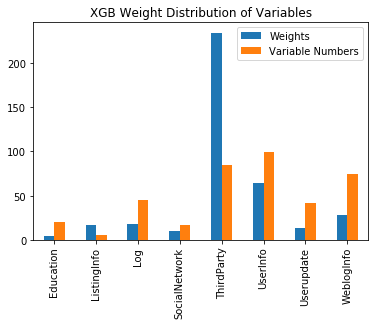

In [31]:
# WeightCI(WeightModel, modelXGBL)
wcolxgb = WeightCI(WeightModel, modelXGBL)
# wcolxgb.to_csv("{}/{}_w_xgb.csv".format(path, title))
RowS_summary(wcolxgb.iloc[:,0], Col_group(wcolxgb.index), ["sum", "count"]).rename(
    columns = {"sum": "Weights", "count": "Variable Numbers"}).plot(kind = "bar", title = "XGB Weight Distribution of Variables")

### xgboost for hyperopt

In [209]:
space = {'max_depth': hp.quniform("max_depth", 1.0, 5.0, 1),
         'min_child_weight': hp.loguniform("min_child_weight", -2, 4),
         'gamma': hp.loguniform("gamma", -6, 2),
         'lambda': hp.loguniform("lambda", 0, 6),
         'colsample_bylevel': hp.uniform('colsample_bylevel', 0.04, 0.15)
}
print(hyperopt.pyll.stochastic.sample(space))

{'gamma': 0.008457338540004933, 'colsample_bylevel': 0.11361085707406962, 'max_depth': 3.0, 'min_child_weight': 44.239900422930084, 'lambda': 9.779636612924643}


In [ ]:
# parda = HpOpt(space, ParModelScore(fmodel=XGBoost)).sort_values(["loss"])
# hpopt调用方法1:
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 30).sort_values(['loss'])
# parda.to_csv("{}/{}_par_xgb.csv".format(path, title))
# paropt = parda.iloc[0, :-1].to_dict()
# parda

   colsample_bylevel     gamma      lambda  max_depth  min_child_weight
0           0.069557  0.014498  244.916136        4.0         22.594927
0.0    0.926747
1.0    0.073253
dtype: float64
0.0    0.926679
1.0    0.073321
dtype: float64
[0]	train-logloss:0.626517	val-logloss:0.626529
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.571686	val-logloss:0.571707
[2]	train-logloss:0.526029	val-logloss:0.52606
[3]	train-logloss:0.487673	val-logloss:0.487712
[4]	train-logloss:0.455232	val-logloss:0.455279
[5]	train-logloss:0.427652	val-logloss:0.427707
[6]	train-logloss:0.404113	val-logloss:0.404175
[7]	train-logloss:0.383962	val-logloss:0.384031
[8]	train-logloss:0.366671	val-logloss:0.366791
[9]	train-logloss:0.351708	val-logloss:0.35176
[10]	train-logloss:0.338906	val-logloss:0.338958
[11]	train-logloss:0.327766	val-logloss:0.327745
[12]	train-logloss:0.318156	val-loglos

In [ ]:
parda

In [77]:
def GroupSelect(xL, i = 0):
    # xLc = xL.copy()
    # 改写
    xLc = copy.copy(xL)
    ingrp = list(xLc.pop(i))
    exgrp = sum([list(x) for x in xLc], [])
    return(ingrp, exgrp)

def TrainSet(x, y, irtL, ig = 0):
    irt2, irt1 = GroupSelect(irtL, i = ig)
    xt1, xt2 = x.loc[irt1].values, x.loc[irt2].values
    yt1, yt2 = y.loc[irt1].values, y.loc[irt2].values
    return(xt1, xt2, yt1, yt2)

# crosstrain的实质就是用一个list把models存起来即可
def CrossTrain(x, y, irtL, fmodel, **kwargs):
    modelL = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
        modelL.append(fmodel(xt1, xt2, yt1, yt2, seed = i, **kwargs))
    return(modelL)

def CrossValid(x, y, irtL, modelL):
    yt2pL = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
        yt2p = ModelPredict(xt2, modelL[i])
        yt2pL.append(yt2p)
    return(yt2pL)

In [27]:
def Score(y, yp, f = met.roc_auc_score):
    score = f(y, yp)
    print("Score: {:.4f}".format(score))
    return(score)

def ModelPredict(xv, fmodel):
    if(type(fmodel) == xgb.core.Booster):
        xv = xgb.DMatrix(xv, missing = np.nan)
    if(type(fmodel) in [LogisticRegression, lm.stochastic_gradient.SGDClassifier, ensm.bagging.BaggingClassifier,
           ensm.weight_boosting.AdaBoostClassifier, ensm.forest.RandomForestClassifier, ensm.forest.ExtraTreesClassifier]):
        yvp = fmodel.predict_proba(xv)[:,1]
    else:
        yvp = fmodel.predict(xv).flatten()
    return(yvp)

### Model Variable Selection (functions)
Importance of variables for models in Y prediction from model training

In [14]:
def PlotWeight(w, score, hl = 0):
    fig = plt.figure()
    w.plot(kind = "bar", grid = True, title = "Score = {:.4}".format(score))
    plt.plot((0, w.shape[0]), (hl, hl), "k-")   
    fig.show()
def WeightModel(model):
    if(type(model) == lm.logistic.LogisticRegression):
        wic = pd.DataFrame({"LR_beta":model.coef_[0]}, index = x.columns)
    elif(type(model) == xgb.core.Booster):
        wic = (pd.concat([pd.Series(icx, index = ['f{}'.format(x) for x in range(len(icx))]), pd.Series(model.get_fscore())], axis = 1)
               .set_index(0).sort_index().fillna(0)[1])
        wic = wic/np.sum(wic)*wic.shape[0]
    return(wic)
def WeightCI(fweight, modelL):
    w = pd.concat(map(fweight, modelL), axis = 1, keys = np.arange(len(modelL)))
    wb = pd.concat([w.mean(axis = 1), w.std(axis = 1)], axis = 1, keys = ["Mean", "Std"])
    wb["LowerCI"] = wb["Mean"] - wb["Std"]*1.96/np.sqrt(len(modelL))
    wb["UpperCI"] = wb["Mean"] + wb["Std"]*1.96/np.sqrt(len(modelL))
    return(wb)

### Model Comparasion and Composite (functions)
Compare one/multiple models with cross validation and weighted average
* functions for evaluate weights of models according to cross-validation scores for weighted-average prediction
* functions for using weights for models to predict

In [31]:
def ScorePlot(scoreL, labels):
    scmean, scmstd = np.mean(scoreL[:,0]), np.std(scoreL[:,0])/np.sqrt(scoreL.shape[0])
    plt.figure()
    plt.boxplot(scoreL, labels = labels, showmeans = True)
    plt.plot((0, scoreL.shape[1]+1), (scmean, scmean), "g-")
    plt.plot((0, scoreL.shape[1]+1), (scmean - 1.96*scmstd, scmean - 1.96*scmstd), "g--") 
    plt.plot((0, scoreL.shape[1]+1), (scmean + 1.96*scmstd, scmean + 1.96*scmstd), "g--") 
    plt.title("Comp Mean Score: {:.4f},  95% CI: ({:.4f}, {:.4f}),  Folds: {}".format(scmean, scmean - 1.96*scmstd, scmean + 1.96*scmstd, scoreL.shape[0]))
    plt.grid()
    plt.show()
    
def CrossPredict(xv, modelL):
    yvpL = []
    for i in range(len(modelL)):
        yvp = ModelPredict(xv, modelL[i])
        yvpL.append(yvp)
    return(yvpL)
def ModelMPredict(yvpM, w = 1):
    yvpcomp = np.array([np.mean(yvpM[i], axis = 0) for i in range(len(yvpM))]).T.dot(w).flatten()
    return(yvpcomp)

# CrossScore —— 备注：支持多模型融合评估！
def CrossScore(y, yt2pM, irtL, w = 1):
    score = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(y, y, irtL, ig = i)
        yt2L = [yt2pM[j][i] for j in range(len(yt2pM))]
        if(w is 1):
            score.append(list(map(lambda x: Score(yt2, x), yt2L)))
        else:
            score.append(Score(yt2, np.array(yt2L).T * w))
    return(np.array(score))

In [155]:
# 利用上面的scoreL 调试ScoreWeight
scoreL

print np.mean(scoreL)
print np.std(scoreL, axis=0)
print (scoreL - np.mean(scoreL))/np.min(np.std(scoreL, axis = 0))
w = np.exp((scoreL - np.mean(scoreL))/np.min(np.std(scoreL, axis = 0)))
w = np.sum(w/np.sum(w), axis = 0)
w
# def ScoreWeight(score):
#     w = np.exp((score - np.mean(score))/np.min(np.std(score, axis = 0)))
#     w = np.sum(w/np.sum(w), axis = 0)
#     return(w)

0.755133971909
[ 0.02021742]
[[-1.00126463]
 [-0.24116456]
 [-0.29138246]
 [-0.17266004]
 [-0.22466175]
 [ 0.15989216]
 [ 1.53231697]
 [-1.08766382]
 [-0.80939553]
 [ 2.13598365]]


array([ 1.])

In [99]:
print yvpL
print [yvpL]

[array([ 0.60712967,  0.26317337,  0.37157109, ...,  0.27154306,
        0.66620191,  0.71037757]), array([ 0.82488016,  0.86368667,  0.92803537, ...,  0.38957173,
        0.27708265,  0.49090852]), array([ 0.3448166 ,  0.6133273 ,  0.89334697, ...,  0.25953749,
        0.56189599,  0.65358625]), array([ 0.93802716,  0.20710714,  0.20079835, ...,  0.47559013,
        0.22029826,  0.20040918]), array([ 0.73309933,  0.63766764,  0.5757978 , ...,  0.12100408,
        0.51888918,  0.20617774]), array([ 0.7935758 ,  0.5454341 ,  0.31668768, ...,  0.53301771,
        0.08762519,  0.12319302]), array([ 0.84535217,  0.31131372,  0.69666674, ...,  0.64717994,
        0.63764277,  0.82138115]), array([ 0.70229251,  0.50827386,  0.81579159, ...,  0.16585232,
        0.18405449,  0.28704901]), array([ 0.92721942,  0.28003164,  0.44730041, ...,  0.41306519,
        0.18659386,  0.44905885]), array([ 0.60574194,  0.24029793,  0.59566093, ...,  0.09008839,
        0.45080746,  0.66925014])]
[[array([

In [ ]:
def ScoreWeight(score):
    w = np.exp((score - np.mean(score))/np.min(np.std(score, axis = 0)))
    w = np.sum(w/np.sum(w), axis = 0)
    return(w)

# ?!
def CrossScore(y, yt2pM, irtL, w = 1):
    score = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(y, y, irtL, ig = i)
        yt2L = [yt2pM[j][i] for j in range(len(yt2pM))]
        if(w is 1):
            score.append(list(map(lambda x: Score(yt2, x), yt2L)))
        else:
            score.append(Score(yt2, np.array(yt2L).T * w))
    return(np.array(score))

def CrossScoreAnalysis(y, yt2pM, irtL, w = [], labels = None):
    scoreL = CrossScore(y, yt2pM, irtL)
    if(len(w) == 0):
        w = ScoreWeight(scoreL)
    score = CrossScore(y, yt2pM, irtL, w)
    ScorePlot(np.vstack([score, scoreL.T]).T, labels)
    return(scoreL, score, np.array(w))

In [222]:
# 10-fold
irtL = Kfolds(irt, k = 10)
# print irtL
# print len(irtL)
# print len(irtL[0])
def GroupSelect(xL, i = 0):
    # xLc = xL.copy()
    # 改写
    xLc = copy.copy(xL)
    ingrp = list(xLc.pop(i))
    exgrp = sum([list(x) for x in xLc], [])
    return(ingrp, exgrp)

def TrainSet(x, y, irtL, ig = 0):
    irt2, irt1 = GroupSelect(irtL, i = ig)
    xt1, xt2 = x.loc[irt1].values, x.loc[irt2].values
    yt1, yt2 = y.loc[irt1].values, y.loc[irt2].values
    return(xt1, xt2, yt1, yt2)

# i = 0
# xLc = copy.copy(irtL)
# ingrp = list(xLc.pop(i))
# exgrp = sum([list(xx) for xx in xLc], [])
# print ingrp
# print len(exgrp)
# xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = 0)

In [223]:
irtL = Kfolds(irt, k = 10)
xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = 0)

In [276]:
# 分析：kfold后的正负样本比例
# 训练集
def calcBalanceRate(y):
    return y.target.value_counts() / y.shape[0]

print calcBalanceRate(y.loc[irt])

for i in range(10):
    xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
    print calcBalanceRate(pd.DataFrame(yt1.flatten(), columns=['target']))

0.0    0.926733
1.0    0.073267
Name: target, dtype: float64
0.0    0.926444
1.0    0.073556
Name: target, dtype: float64
0.0    0.927111
1.0    0.072889
Name: target, dtype: float64
0.0    0.926481
1.0    0.073519
Name: target, dtype: float64
0.0    0.926704
1.0    0.073296
Name: target, dtype: float64
0.0    0.926185
1.0    0.073815
Name: target, dtype: float64
0.0    0.927259
1.0    0.072741
Name: target, dtype: float64
0.0    0.926667
1.0    0.073333
Name: target, dtype: float64
0.0    0.927333
1.0    0.072667
Name: target, dtype: float64
0.0    0.926741
1.0    0.073259
Name: target, dtype: float64
0.0    0.926407
1.0    0.073593
Name: target, dtype: float64


In [18]:
model = Classifier(xt1, xt2, yt1, yt2, seed = 0, modeltype = lm.LogisticRegression, parmodel = 
                   {"penalty": "l2", "C": 0.003, "class_weight": 'balanced', 'solver': 'sag'})
# 备注：如何确定超参数的最优取值？如C=0.003

Score: 0.7779
Time: 3.09 seconds


In [21]:
# model = XGBoost(xt1, xt2, yt1, yt2, seed = 0, parmodel = 
#                 {'colsample_bylevel': 0.07, 'eta': 0.05, 'max_depth': 3, 'lambda': 50, 'min_child_weight': 1.5, 'gamma': 0.2})

In [22]:
# model = DNN(xt1, xt2, yt1, yt2, seed = 0, parmodel = 
#             {"nhidlayer": 1, "rdrop": 0.5, "nhidnode": 500, 'optimizer': "rmsprop", "batch_size": 64, "dropout": 0.5})

In [24]:
# model = Classifier(xt1, xt2, yt1, yt2, seed = 0, modeltype = ensm.BaggingClassifier, parmodel = 
#                    {"base_estimator":ensm.ExtraTreesClassifier(criterion='entropy', min_weight_fraction_leaf=0, max_depth = 8),
#                    "n_estimators": 1000, "max_features": 1})

## Model Hyper-parameters Optimization
Hyper-parameters optimization for models with cross validaion

Warning: The process of hyper-parameters optimization may take a very long time = N(iterations)\*K(folds)\*T(single model)

In [78]:
# debug for ParModelScore
par = {"penalty": "l2", "C": 0.003, "class_weight": 'balanced', 'solver': 'sag'}
irtL_t = Kfolds(irt, k = 5)
irtL_t
# modelL = CrossTrain(x, y, irtL_t, fmodel=Classifier, parmodel = par)
# yt2pL = CrossValid(x, y, irtL_t, modelL)
# score = np.mean(CrossScoreAnalysis(y, [yt2pL], irtL)[0])
# return(-score)

[array([40685, 45632, 91617, ..., 56427, 64931, 46243]),
 array([87095, 34682, 53412, ..., 16891, 42695, 66844]),
 array([85165, 55484, 57927, ...,  9648, 49878, 67774]),
 array([32176, 10724, 22908, ..., 48079, 41510,   609]),
 array([33413, 12624, 50172, ..., 44525, 10564,  9270])]

In [65]:
# [yt2pL]
# score = np.mean(CrossScoreAnalysis(y, [yt2pL], irtL)[0])
scoreL = CrossScore(y, [yt2pL], irtL_t)
print scoreL
print scoreL.shape
w = []
labels = None
if(len(w) == 0):
    w = ScoreWeight(scoreL)
score = CrossScore(y, yt2pM, irtL, w)
ScorePlot(np.vstack([score, scoreL.T]).T, labels)
return(scoreL, score, np.array(w))

Score: 0.7655
Score: 0.7490
Score: 0.7599
Score: 0.7823
Score: 0.7748
[[ 0.76546057]
 [ 0.74904007]
 [ 0.7599496 ]
 [ 0.78234263]
 [ 0.77481701]]
(5, 1)


0
[ 1.]
Score: 0.7655
Score: 0.7490
Score: 0.7599
Score: 0.7823
Score: 0.7748


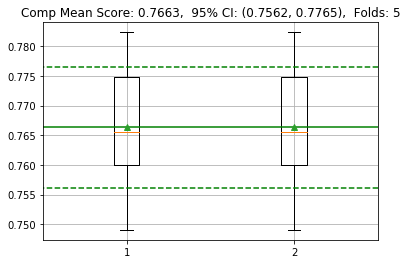

In [78]:
w = []
labels = None
print len(w)
if len(w) == 0:
    w = np.exp((scoreL - np.mean(scoreL))/np.min(np.std(scoreL, axis = 0)))
    w = np.sum(w/np.sum(w), axis = 0)
print w
score = CrossScore(y, [yt2pL], irtL_t, w)
ScorePlot(np.vstack([score, scoreL.T]).T, labels)

In [60]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
import hyperopt.pyll.stochastic

def ParColScore(par, fmodel = XGBoost):
    icx = list(wcol.index[wcol.iloc[:,1] > par["a"]])
    x = dac.loc[:, icx]
    x = x.apply(lambda x: x.fillna(x.median()),axis=0)
    x = (x.rank(pct = True)-0.5/x.shape[0]).apply(st.norm.ppf)
    modelL = CrossTrain(x, y, irtL, fmodel)
    yt2pL = CrossValid(x, y, irtL, modelL)
    score = np.mean(CrossScoreAnalysis(y, [yt2pL], irtL)[0])
    return(-score)

# 5-folds
# CrossTrain five models
def ParModelScore(par, fmodel = XGBoost):
    irtL = Kfolds(irt, k = 5)
    modelL = CrossTrain(x, y, irtL, fmodel, parmodel = par)
    yt2pL = CrossValid(x, y, irtL, modelL)
    score = np.mean(CrossScoreAnalysis(y, [yt2pL], irtL)[0])
    return(-score)

def HpOpt(space, fhpscore, seed = 0, max_evals = 50):
    def Obj(par):
        print(pd.DataFrame(par, index = [seed]))
        return({
            'loss': fhpscore(par),
            'status': STATUS_OK,
            'loss_variance': 5e-5
            })
    
    np.random.seed(seed)
    trials = Trials()
    best = fmin(Obj,
        space=space,
        algo=tpe.suggest,
        max_evals=max_evals,
        trials=trials)
    op = pd.concat([pd.DataFrame([sum(list(trials.trials[i]["misc"]["vals"].values()), []) for i in range(len(trials))],
                                 columns = list(trials.trials[0]["misc"]["vals"].keys())),
           pd.DataFrame({"loss": trials.losses()})], axis = 1)
    return(op)

In [69]:
print np.exp(-10)
print np.exp(-1)
space = {'C': hp.loguniform('C', -10, -1)}
print(hyperopt.pyll.stochastic.sample(space))

4.53999297625e-05
0.367879441171
{'C': 0.00010508093979893652}


## Model Training
Cross model and prediction results from optimized model variables and hyper-parameters

In [93]:
def Kfolds(x, k = 10, seed = 1):
    np.random.seed(seed)
    xL = np.array_split(np.random.choice(x, len(x), replace = False), k) #  相当于shuffle
    return(xL)

def GroupSelect(xL, i = 0):
    # xLc = xL.copy()
    # 改写
    xLc = copy.copy(xL)
    ingrp = list(xLc.pop(i))
    exgrp = sum([list(x) for x in xLc], [])
    return(ingrp, exgrp)

def TrainSet(x, y, irtL, ig = 0):
    irt2, irt1 = GroupSelect(irtL, i = ig)
    xt1, xt2 = x.loc[irt1].values, x.loc[irt2].values
    yt1, yt2 = y.loc[irt1].values, y.loc[irt2].values
    return(xt1, xt2, yt1, yt2)

def CrossTrain(x, y, irtL, fmodel, **kwargs):
    modelL = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
        modelL.append(fmodel(xt1, xt2, yt1, yt2, seed = i, **kwargs))
    return(modelL)

def CrossValid(x, y, irtL, modelL):
    yt2pL = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
        yt2p = ModelPredict(xt2, modelL[i])
        yt2pL.append(yt2p)
    return(yt2pL)

In [94]:
def ScoreWeight(score):
    w = np.exp((score - np.mean(score))/np.min(np.std(score, axis = 0)))
    w = np.sum(w/np.sum(w), axis = 0)
    return(w)

# ?!
def CrossScore(y, yt2pM, irtL, w = 1):
    score = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(y, y, irtL, ig = i)
        yt2L = [yt2pM[j][i] for j in range(len(yt2pM))]
        if(w is 1):
            score.append(list(map(lambda x: Score(yt2, x), yt2L)))
        else:
            score.append(Score(yt2, np.array(yt2L).T * w))
    return(np.array(score))

def CrossScoreAnalysis(y, yt2pM, irtL, w = [], labels = None):
    scoreL = CrossScore(y, yt2pM, irtL)
    if(len(w) == 0):
        w = ScoreWeight(scoreL)
    score = CrossScore(y, yt2pM, irtL, w)
    ScorePlot(np.vstack([score, scoreL.T]).T, labels)
    return(scoreL, score, np.array(w))